In [1]:
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
import tensorflow_datasets as tfds

In [2]:
print(tf.__version__)

2.19.0


In [12]:
import pathlib
import tensorflow as tf

dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
archive = tf.keras.utils.get_file(origin=dataset_url, extract=True)
# archive: /root/.keras/datasets/flower_photos.tgz
data_dir = pathlib.Path(archive) / 'flower_photos'

print(f"새롭게 설정된 data_dir 경로: {data_dir}")

새롭게 설정된 data_dir 경로: /root/.keras/datasets/flower_photos.tgz/flower_photos


In [13]:
# [4]번 셀 코드
image_count = len(list(data_dir.glob('**/*.jpg')))
print(f"최종 이미지 개수: {image_count}")

최종 이미지 개수: 3670


퍼실님 코드 따라하기

In [14]:

import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


In [ ]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    # 여기 경로 바꿔주시고
    data_dir='./content',
    # 여기 True로 변경
    download=True,
    with_info=True,
    as_supervised=True,
)

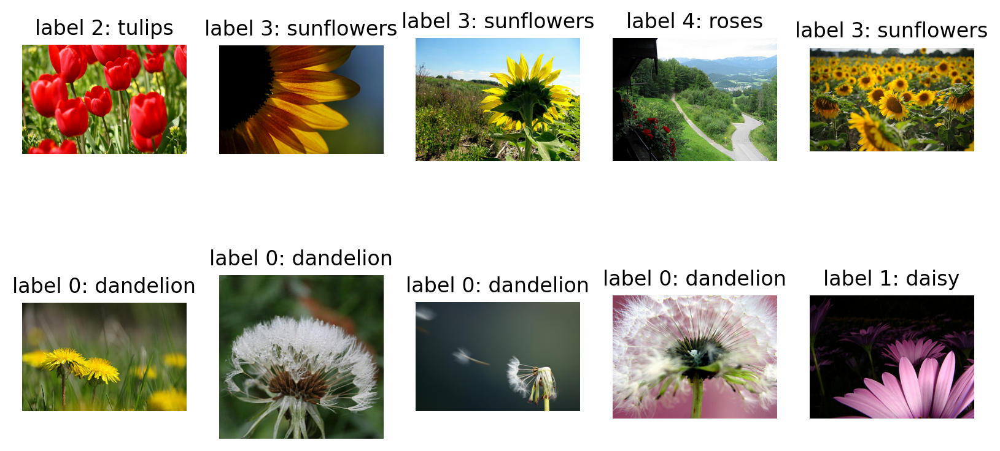

In [33]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))

# 라벨 인덱스를 실제 꽃 이름(문자열)으로 변환하는 함수를 가져옵니다.
get_label_name = metadata.features['label'].int2str

# raw_train 데이터셋에서 10개의 데이터를 가져와 순회합니다.
for idx, (image, label) in enumerate(raw_train.take(10)):
    # 2행 5열의 서브플롯 중 idx+1 번째 위치에 그림을 그립니다.
    plt.subplot(2, 5, idx + 1)

    # 이미지를 표시합니다.
    plt.imshow(image)

    # 이미지 제목을 설정합니다. (예: label 2: daisy)
    plt.title(f'label {label}: {get_label_name(label)}')

    # 축(x, y 눈금)을 제거합니다.
    plt.axis('off')

# 전체 그림을 화면에 보여줍니다.
plt.show()

In [16]:

IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

In [17]:

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [18]:

IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


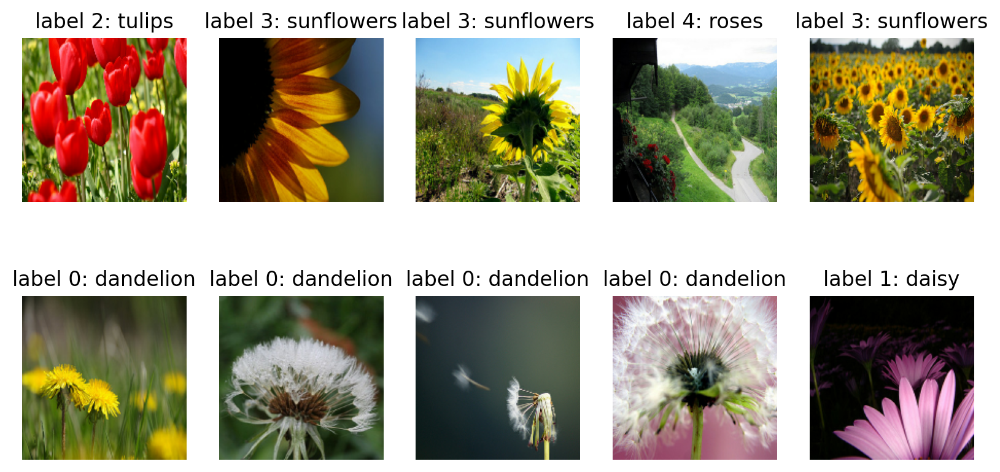

In [34]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [35]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [19]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [20]:

feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [21]:

global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [22]:

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


Dense Layer에 L2 규제를 추가

In [30]:
import tensorflow.keras.regularizers as regularizers

dense_layer = tf.keras.layers.Dense(units=256,
                                    activation='relu', kernel_regularizer=regularizers.l2(0.0001))

# 이부분에서 5개로 바꿔준다 : label의 class가 5개이기때문
prediction_layer = tf.keras.layers.Dense(units=5,
                                         activation='softmax')

prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 5)


In [36]:

base_model.trainable = False

In [37]:

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [38]:

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 5, 5, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,301 (56.64 MB)

 Trainable params: 132,613 (518.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [39]:

base_learning_rate = 0.0001
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)


In [40]:

validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 101s 5s/step - accuracy: 0.1405 - loss: 1.8086
initial loss: 1.80
initial accuracy: 0.16


In [41]:

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.
# [[YOUR CODE]]
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 933s 10s/step - accuracy: 0.3098 - loss: 1.6022 - val_accuracy: 0.5777 - val_loss: 1.3230
Epoch 2/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 886s 10s/step - accuracy: 0.6250 - loss: 1.2688 - val_accuracy: 0.7057 - val_loss: 1.0837
Epoch 3/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 934s 10s/step - accuracy: 0.7116 - loss: 1.0630 - val_accuracy: 0.7139 - val_loss: 0.9423
Epoch 4/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 935s 10s/step - accuracy: 0.7373 - loss: 0.9304 - val_accuracy: 0.7384 - val_loss: 0.8427
Epoch 5/5
92/92 ━━━━━━━━━━━━━━━━━━━━ 887s 10s/step - accuracy: 0.7728 - loss: 0.8223 - val_accuracy: 0.7411 - val_loss: 0.7814


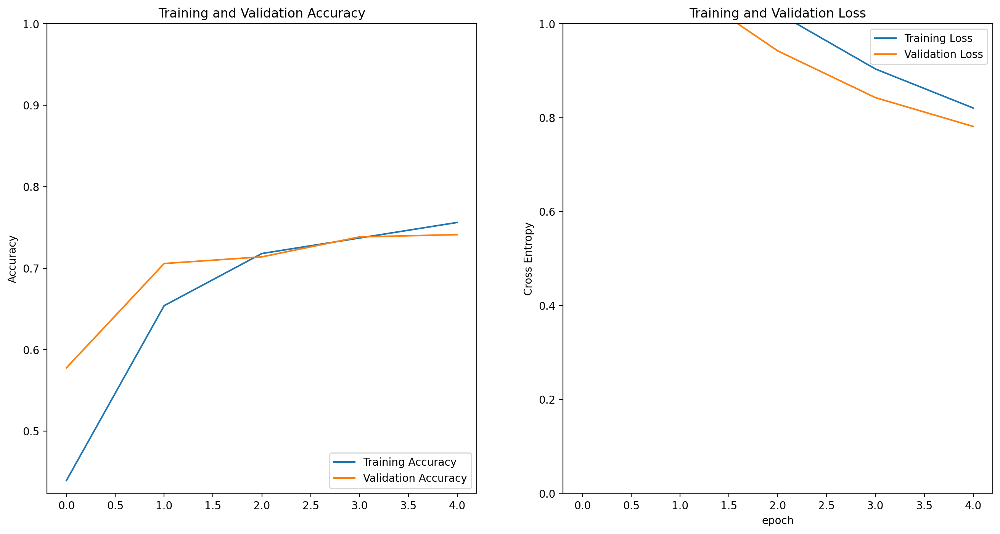

In [42]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [43]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


array([[9.53397825e-02, 1.13200955e-01, 4.81044739e-01, 1.88247085e-01,
        1.22167461e-01],
       [9.54785764e-01, 2.19967403e-02, 4.12487285e-03, 1.19356699e-02,
        7.15699792e-03],
       [6.57053471e-01, 1.02945611e-01, 6.06304072e-02, 1.39009356e-01,
        4.03610468e-02],
       [3.16440277e-02, 7.34447613e-02, 4.65082556e-01, 5.10504693e-02,
        3.78778160e-01],
       [5.67404091e-01, 2.15385944e-01, 9.11780745e-02, 5.61247468e-02,
        6.99070394e-02],
       [7.76853502e-01, 9.60551649e-02, 3.95841002e-02, 6.76479563e-02,
        1.98593121e-02],
       [5.95469438e-02, 5.74949421e-02, 4.89681691e-01, 2.40017623e-01,
        1.53258726e-01],
       [4.04226542e-01, 2.66029924e-01, 3.54902893e-02, 2.48333737e-01,
        4.59194593e-02],
       [7.37100914e-02, 2.29533147e-02, 8.41745809e-02, 6.53287768e-01,
        1.65874273e-01],
       [9.85985339e-01, 5.92420530e-03, 7.91181694e-04, 6.36816118e-03,
        9.31184273e-04],
       [8.85832429e-01, 4.3712

In [44]:

import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 0, 3, 0, 0, 1, 3, 4, 0, 3, 2, 0, 4, 2, 2, 0,
       2, 0, 1, 3, 2, 4, 4, 3, 0, 4])

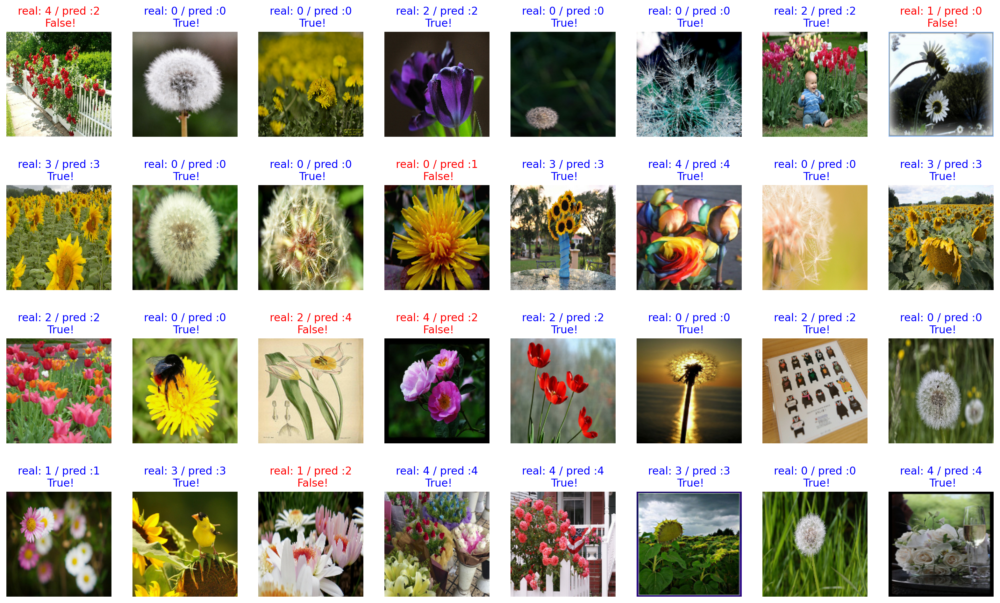

In [45]:

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [46]:

count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

81.25
